In [1]:
### Signature Extraction 
### YOLO v8 nano - fine-tuned on multiple hand-signature datasets
### working in a Kaggle notebook - P100 GPU

In [2]:
# Installing dependencies

!pip install ultralytics
!pip install roboflow
!pip install -U ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 20.7 MB/s eta 0:00:0000:01
Reason for being yanked: deprecated, use 4.8.0.76
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 31.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.10.0.82
    Uninstalling opencv-python-headless-4.10.0.82:
      Successfully uninstalled opencv-python-headless-4.10.0.82
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attemptin

In [3]:
# Importing dependencies

from ultralytics import YOLO
from roboflow import Roboflow
import torch
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# Initialize Roboflow
rf = Roboflow(api_key="-")

In [6]:
# Check the available GPUs

!nvidia-smi

Thu Jun  6 07:52:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0              26W / 250W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [5]:
# Load a pretrained model

model = YOLO("yolov8n.pt")  # YOLO v8 nano

In [7]:
# Loading signature dataset 1 

# Cheques Signatures
# https://universe.roboflow.com/micr-ttmht/signature_verification-tppid/dataset/1

project = rf.workspace("micr-ttmht").project("signature_verification-tppid")
version = project.version(1)
dataset = version.download("yolov9") # the YOLOv9 format for the dataset is the one compatible with YOLOv8n 

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to signature_verification-1 in yolov9:: 100%|██████████| 548/548 [00:00<00:00, 6960.45it/s]


In [8]:
# Create yaml_1 file 

with open('data_1.yaml', 'w') as f:
  f.write("""
train: /kaggle/working/signature_verification-1/train/images
val: /kaggle/working/signature_verification-1/valid/images
test: /kaggle/working/signature_verification-1/test/images
nc: 1
names: ['signature']
""")

In [9]:
# Loading signature dataset 2 

# Any Document Signatures
# https://universe.roboflow.com/signaturedetection/signature-krkm0/dataset/1

project = rf.workspace("signaturedetection").project("signature-krkm0")
version = project.version(1)
dataset = version.download("yolov9")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Signature-1 in yolov9:: 100%|██████████| 404/404 [00:00<00:00, 5437.97it/s]


In [10]:
# Create yaml_2 file

with open('data_2.yaml', 'w') as f:
  f.write("""
train: /kaggle/working/Signature-1/train/images
val: /kaggle/working/Signature-1/valid/images
test: /kaggle/working/Signature-1/test/images
nc: 1
names: ['signature']
""")

In [10]:
# Loading signature dataset 3 

# Any Document Signatures, more data
# (https://universe.roboflow.com/mapo80/signature-hxrig/dataset/3)

project = rf.workspace("mapo80").project("signature-hxrig")
version = project.version(3)
dataset = version.download("yolov9")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Signature-3 in yolov9:: 100%|██████████| 34452/34452 [00:04<00:00, 7005.20it/s] 


In [11]:
# Create yaml_3 file

with open('data_3.yaml', 'w') as f:
  f.write("""
train: /kaggle/working/Signature-3/train/images
val: /kaggle/working/Signature-3/valid/images
test: /kaggle/working/Signature-3/test/images
nc: 1
names: ['signature']
""")

In [13]:
# Train the model - Any Document Signatures Data - large Versitle Dataset

model_v1 = model.train(data="/kaggle/working/data_3.yaml", 
                       epochs=50, 
                       batch=128, # or -1 for AutoBatch
                       overlap_mask=False, # Determines whether segmentation masks should overlap during training 
                       save=True, # Enables saving of training checkpoints and final model weights
                       device=0, # "mps" for Appple silicon or [0, 1] for multi-GPU
                       optimizer='auto', # Auto selct the suitable optimizer
                       close_mosaic=20, # Disables mosaic data augmentation in the last N epochs to stabilize training
                       val=True, # Enables Validation
                       plots=True, # Generates and saves plots of training, validation metrics, and prediction examples
                       dropout=0.2, # Rate for regularization, preventing overfitting by randomly dropping units during training
                       translate=0.4, # Translates the image horizontally and vertically, aiding in learning to detect partially visible objects
                       scale=0.7, # Scales the image by a gain factor, simulating objects at different distances from the camera
                       degrees=30, # Random rotation within the specified degree range, improving the recognition ability at various orientations
                       hsv_v=0.7, # Alters the value (brightness), helping the model to perform well under various lighting conditions
                       hsv_s=0.9, # Alters the saturation, simulating different environmental conditions
                       hsv_h=0.3, # Alters the hue, introducing color variability
                       )

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data_3.yaml, epochs=50, time=None, patience=100, batch=128, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=20, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=False, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

100%|██████████| 755k/755k [00:00<00:00, 22.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/Signature-3/train/labels... 15994 images, 845 backgrounds, 0 corrupt: 100%|██████████| 15994/15994 [00:12<00:00, 1262.88it/s]


train: New cache created: /kaggle/working/Signature-3/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 135, len(boxes) = 20286. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Signature-3/valid/labels... 775 images, 77 backgrounds, 0 corrupt: 100%|██████████| 775/775 [00:00<00:00, 1708.23it/s]


val: New cache created: /kaggle/working/Signature-3/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 10, len(boxes) = 1225. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      15.7G      1.396      2.046      1.675        319        640: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.08s/it]

                   all        775       1225      0.318      0.339      0.245     0.0819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      15.6G      1.235      1.385      1.546        284        640: 100%|██████████| 125/125 [02:22<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.68s/it]


                   all        775       1225      0.401      0.372      0.313      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      15.6G       1.24      1.273      1.559        347        640: 100%|██████████| 125/125 [02:21<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]


                   all        775       1225      0.451      0.414      0.374      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      15.6G      1.215      1.186      1.532        295        640: 100%|██████████| 125/125 [02:20<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.76s/it]


                   all        775       1225      0.371      0.563      0.345      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      15.6G      1.137      1.075      1.477        288        640: 100%|██████████| 125/125 [02:21<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


                   all        775       1225      0.509      0.512      0.477      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      15.6G      1.114      1.042      1.453        335        640: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]


                   all        775       1225      0.581      0.661      0.629       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      15.6G      1.066     0.9758      1.412        297        640: 100%|██████████| 125/125 [02:21<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.74s/it]

                   all        775       1225      0.672      0.687      0.678      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      15.6G      1.048     0.9465      1.399        335        640: 100%|██████████| 125/125 [02:24<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.66s/it]

                   all        775       1225      0.605      0.659      0.668      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      15.6G      1.015     0.9127      1.381        296        640: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.75s/it]


                   all        775       1225      0.678      0.733      0.745      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      15.6G       1.01      0.895      1.373        304        640: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.49s/it]

                   all        775       1225      0.699      0.771      0.783      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      15.6G     0.9864     0.8679      1.355        315        640: 100%|██████████| 125/125 [02:20<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.61s/it]

                   all        775       1225      0.739      0.711      0.753      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      15.6G     0.9664     0.8448      1.341        331        640: 100%|██████████| 125/125 [02:20<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]

                   all        775       1225      0.726       0.66      0.699      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      15.6G     0.9607     0.8319      1.333        325        640: 100%|██████████| 125/125 [02:25<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.62s/it]

                   all        775       1225      0.691      0.706       0.71      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      15.6G      0.943     0.8067      1.324        286        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.55s/it]

                   all        775       1225      0.792      0.747      0.829      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      15.6G     0.9287     0.7967      1.311        311        640: 100%|██████████| 125/125 [02:20<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.75s/it]

                   all        775       1225      0.786      0.791      0.846      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      15.6G      0.931      0.792      1.309        298        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.56s/it]

                   all        775       1225      0.721      0.735      0.778        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      15.6G     0.9197     0.7846      1.304        318        640: 100%|██████████| 125/125 [02:21<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.67s/it]


                   all        775       1225      0.773      0.738      0.808      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      15.6G     0.9138     0.7781      1.301        293        640: 100%|██████████| 125/125 [02:20<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.72s/it]


                   all        775       1225      0.791       0.83      0.861      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      15.6G     0.8999     0.7604       1.29        322        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.53s/it]

                   all        775       1225      0.818      0.825      0.867      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      15.6G     0.8982     0.7496      1.288        297        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.53s/it]

                   all        775       1225      0.816      0.794      0.867      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      15.6G     0.8951     0.7489      1.283        341        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.56s/it]

                   all        775       1225      0.798      0.779      0.842       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      15.6G     0.8731     0.7278      1.274        299        640: 100%|██████████| 125/125 [02:22<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.35s/it]

                   all        775       1225      0.736       0.78      0.789      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      15.6G     0.8804     0.7266      1.272        319        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.54s/it]

                   all        775       1225      0.747      0.778      0.825      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      15.6G      0.871     0.7191      1.266        333        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.39s/it]

                   all        775       1225      0.834      0.802       0.86      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      15.6G     0.8713     0.7168      1.264        317        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.55s/it]

                   all        775       1225      0.792       0.84      0.861      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      15.6G     0.8587     0.7064      1.259        284        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.54s/it]

                   all        775       1225      0.806       0.81       0.86      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      15.6G     0.8582     0.6986      1.255        333        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.33s/it]

                   all        775       1225      0.781       0.79      0.849      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      15.6G     0.8462     0.6908      1.248        335        640: 100%|██████████| 125/125 [02:18<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.32s/it]

                   all        775       1225      0.774      0.784      0.823      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      15.6G     0.8429     0.6919      1.245        321        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.56s/it]

                   all        775       1225      0.798      0.819      0.867      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      15.6G     0.8423     0.6838      1.245        311        640: 100%|██████████| 125/125 [02:19<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.70s/it]


                   all        775       1225      0.786       0.82      0.847      0.458
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      15.9G     0.8458     0.6545      1.261        138        640: 100%|██████████| 125/125 [02:24<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]

                   all        775       1225      0.831      0.812      0.883      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      15.6G     0.8385     0.6366      1.258        149        640: 100%|██████████| 125/125 [02:16<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]

                   all        775       1225      0.789      0.829       0.86      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      15.6G      0.837     0.6301      1.252        149        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.07s/it]

                   all        775       1225       0.77      0.782      0.849      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      15.6G     0.8302      0.622      1.249        133        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.10s/it]

                   all        775       1225      0.847      0.834      0.896      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      15.6G     0.8262     0.6143      1.247        138        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.15s/it]

                   all        775       1225       0.84       0.82      0.885      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      15.6G      0.823     0.6067      1.242        137        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.09s/it]

                   all        775       1225      0.855      0.832      0.897      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      15.6G     0.8141     0.6028       1.24        133        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.09s/it]

                   all        775       1225      0.845      0.845      0.898      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      15.6G     0.8107     0.5934      1.237        132        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.10s/it]

                   all        775       1225      0.845      0.846      0.896      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      15.6G     0.8026     0.5838       1.23        141        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.08s/it]

                   all        775       1225      0.849      0.829      0.895      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      15.6G     0.7976     0.5852      1.229        131        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.21s/it]

                   all        775       1225      0.852      0.825      0.895      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      15.6G     0.7897     0.5695      1.222        131        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.09s/it]

                   all        775       1225      0.876      0.852      0.918      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      15.6G     0.7871     0.5682       1.22        125        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]

                   all        775       1225      0.859      0.848      0.909      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      15.6G     0.7834     0.5614      1.214        134        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.13s/it]

                   all        775       1225      0.838      0.835      0.884      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      15.6G     0.7778      0.555      1.209        146        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]

                   all        775       1225      0.852      0.841      0.894      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      15.6G     0.7737     0.5567      1.207        126        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.04s/it]

                   all        775       1225      0.847      0.854      0.897       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      15.6G     0.7748     0.5446      1.209        142        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.15s/it]

                   all        775       1225      0.879      0.836      0.905      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      15.6G     0.7653     0.5422        1.2        133        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]

                   all        775       1225      0.853      0.855      0.903      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      15.6G      0.761     0.5389      1.198        124        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.13s/it]

                   all        775       1225      0.873      0.861       0.91      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      15.6G     0.7549     0.5359      1.199        143        640: 100%|██████████| 125/125 [02:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.13s/it]

                   all        775       1225      0.876      0.852      0.913      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      15.6G     0.7528     0.5308      1.193        132        640: 100%|██████████| 125/125 [02:15<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.20s/it]

                   all        775       1225      0.867      0.856      0.911      0.513



50 epochs completed in 2.029 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:07<00:00,  1.77s/it]


                   all        775       1225       0.88      0.836      0.905      0.524
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▂▂▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇█████████████
metrics/mAP50-95(B),▁▂▂▂▄▄▅▅▅▄▅▆▆▆▇▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇██████████
metrics/precision(B),▁▂▃▂▄▅▅▅▆▆▆▇▆▇▇▇▇▆▆▇▇▇▇▇▇▇▇███████▇█████
metrics/recall(B),▁▁▂▄▅▆▅▆▆▅▆▆▆▆██▇▇▇▇▇▇▇▇▇█▇█████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▆▆▆▅▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁


Text(0.5, 1.0, 'model_v1 Train Results')

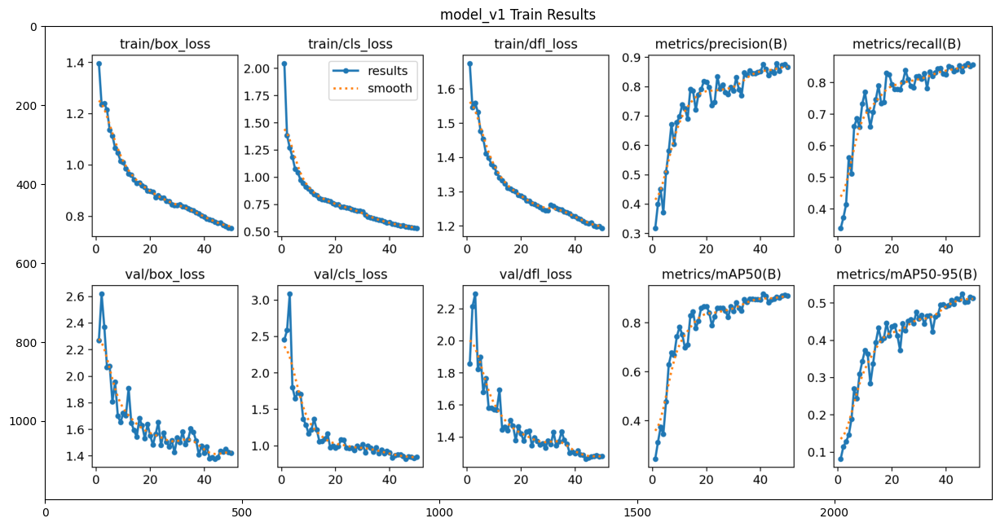

In [81]:
plt.figure(figsize=(15,8))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/results.png"))
plt.title("model_v1 Train Results")

Text(0.5, 1.0, 'val_batch0_pred')

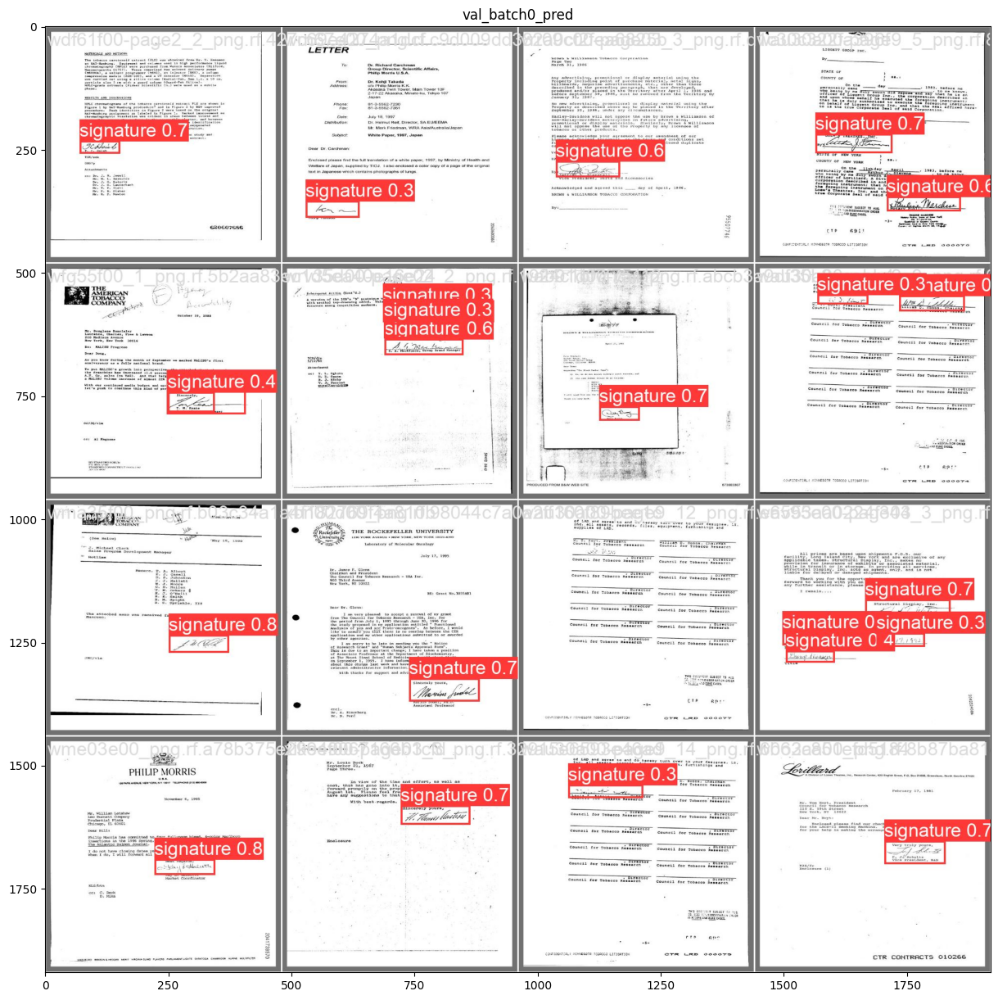

In [87]:
plt.figure(figsize=(15,15))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/val_batch0_pred.jpg"))
plt.title("val_batch0_pred")

Text(0.5, 1.0, 'confusion_matrix_normalized')

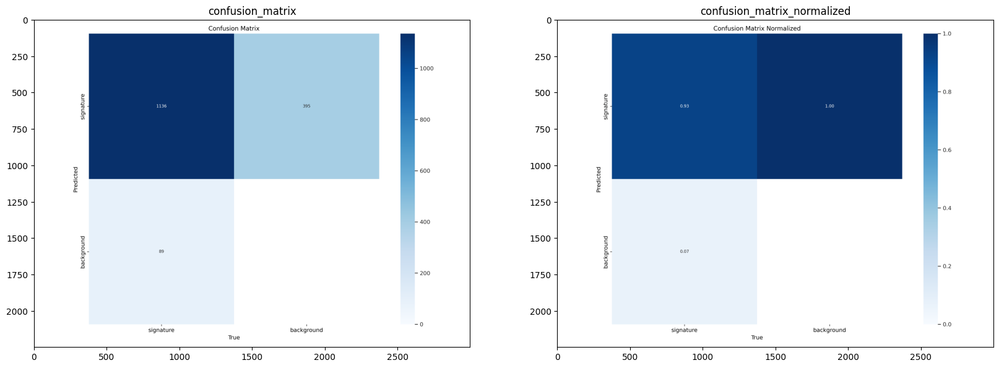

In [86]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/confusion_matrix.png"))
plt.title("confusion_matrix")
plt.subplot(1,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/confusion_matrix_normalized.png"))
plt.title("confusion_matrix_normalized")

Text(0.5, 1.0, 'PR_curve')

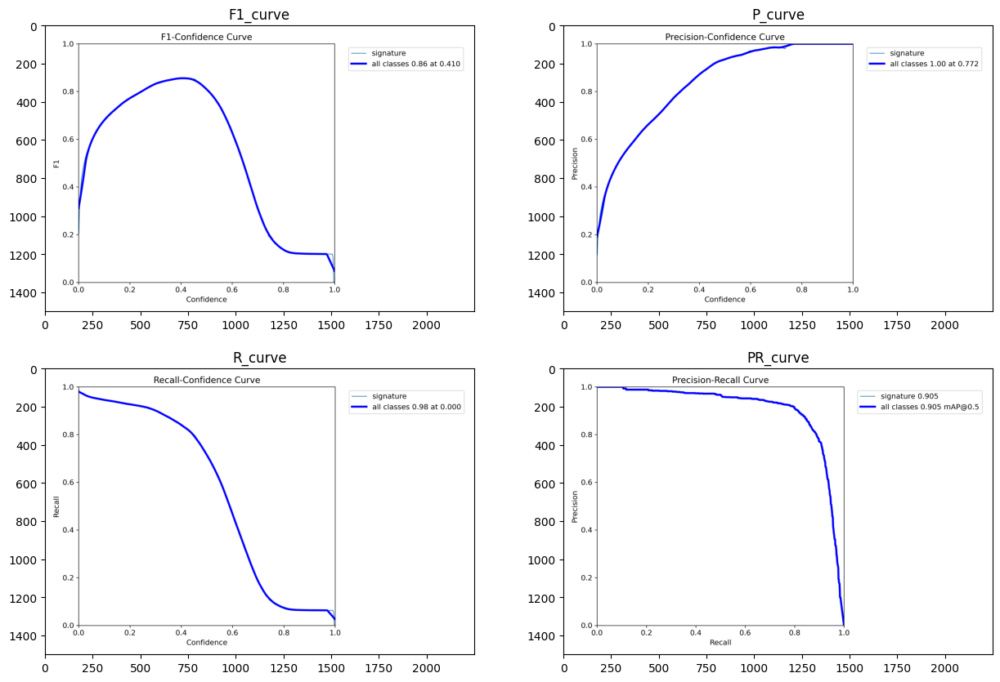

In [89]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/F1_curve.png"))
plt.title("F1_curve")
plt.subplot(2,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/P_curve.png"))
plt.title("P_curve")
plt.subplot(2,2,3)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/R_curve.png"))
plt.title("R_curve")
plt.subplot(2,2,4)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/PR_curve.png"))
plt.title("PR_curve")

In [16]:
# Train the model - Any Document Signatures Data

model_v2 = model.train(data="/kaggle/working/data_2.yaml",
                       epochs=50, # twice -> 100 in total
                       batch=64, # or -1 for AutoBatch
                       overlap_mask=False, # Determines whether segmentation masks should overlap during training 
                       save=True, # Enables saving of training checkpoints and final model weights
                       device=0, # "mps" for Appple silicon or [0, 1] for multi-GPU
                       optimizer='auto', # Auto selct the suitable optimizer
                       close_mosaic=20, # Disables mosaic data augmentation in the last N epochs to stabilize training
                       val=True, # Enables Validation
                       plots=True, # Generates and saves plots of training, validation metrics, and prediction examples
                       dropout=0.2, # Rate for regularization, preventing overfitting by randomly dropping units during training
                       translate=0.4, # Translates the image horizontally and vertically, aiding in learning to detect partially visible objects
                       scale=0.7, # Scales the image by a gain factor, simulating objects at different distances from the camera
                       degrees=30, # Random rotation within the specified degree range, improving the recognition ability at various orientations
                       hsv_v=0.7, # Alters the value (brightness), helping the model to perform well under various lighting conditions
                       hsv_s=0.9, # Alters the saturation, simulating different environmental conditions
                       hsv_h=0.3, # Alters the hue, introducing color variability
                       )

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/spark-it_model_v1_05-06.pt/pytorch/model_v1_05-06.pt/1/model_v1_05-06.pt, data=/kaggle/working/data_2.yaml, epochs=50, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=20, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=False, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_tx

wandb: Currently logged in as: adamsalehbk (enetcom-tn). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/Signature-1/train/labels.cache... 180 images, 0 backgrounds, 0 corrupt: 100%|██████████| 180/180 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Signature-1/valid/labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.33G      1.341      1.145       1.43        445        640: 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         10         70      0.913      0.898      0.912      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       8.2G      1.312      1.129      1.414        347        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.04it/s]

                   all         10         70      0.942      0.925      0.922      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       8.2G      1.252      1.083      1.366        396        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.49it/s]

                   all         10         70      0.915      0.929      0.942      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       8.2G      1.258      1.103      1.365        387        640: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.52it/s]

                   all         10         70      0.864      0.857       0.91      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.21G      1.245      1.123      1.346        337        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.36it/s]

                   all         10         70      0.705      0.586      0.638        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.09G      1.263      1.126      1.367        505        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.27it/s]

                   all         10         70      0.725      0.753      0.724      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.19G      1.258      1.117      1.356        512        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.61it/s]

                   all         10         70      0.824      0.786      0.793      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.21G      1.215       1.08       1.33        305        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.92it/s]

                   all         10         70      0.862      0.814      0.833      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.18G      1.262      1.048      1.337        444        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.34it/s]

                   all         10         70      0.871        0.8       0.83      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       8.2G      1.299      1.054      1.381        388        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.39it/s]

                   all         10         70      0.875      0.829      0.859      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.25G      1.354      1.049      1.403        355        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]

                   all         10         70      0.833      0.857      0.831      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.16G      1.248       1.11      1.393        354        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.15it/s]

                   all         10         70      0.684        0.8      0.763      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.13G      1.268      1.118      1.394        389        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]

                   all         10         70      0.797       0.84      0.839      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       8.2G      1.307      1.114      1.385        394        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.44it/s]

                   all         10         70      0.836      0.829      0.853      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.15G      1.254      1.091      1.383        388        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.71it/s]

                   all         10         70      0.718      0.762      0.788      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.11G      1.322      1.115      1.428        425        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.37it/s]

                   all         10         70      0.895      0.857      0.884      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.25G      1.276      1.081      1.413        404        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.98it/s]

                   all         10         70      0.574      0.614      0.593      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.17G      1.313      1.082      1.392        431        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.82it/s]

                   all         10         70      0.834      0.714        0.8      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.25G       1.35      1.117       1.43        445        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.06it/s]

                   all         10         70      0.867      0.839      0.893      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.22G      1.279      1.092      1.399        326        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.50it/s]

                   all         10         70      0.696       0.85      0.843      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       8.2G      1.273      1.083      1.352        357        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.25it/s]

                   all         10         70      0.804      0.764      0.836      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.18G      1.279       1.09      1.383        428        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.13it/s]

                   all         10         70      0.828      0.743      0.808      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.24G      1.267      1.033       1.37        417        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.99it/s]

                   all         10         70      0.865      0.857      0.882      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       8.2G       1.23     0.9815      1.338        349        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.00it/s]

                   all         10         70      0.808      0.729      0.748      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.18G      1.247     0.9782      1.342        471        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.51it/s]

                   all         10         70       0.77        0.8      0.703      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.15G      1.301      1.025       1.37        464        640: 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.05it/s]

                   all         10         70      0.788      0.795      0.727      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.16G      1.275     0.9954      1.363        413        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.82it/s]

                   all         10         70      0.823      0.786      0.789      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       8.2G      1.292      1.014      1.414        433        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.35it/s]

                   all         10         70      0.781      0.686      0.772      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.14G      1.298      1.007      1.403        456        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.79it/s]

                   all         10         70      0.738        0.8      0.799      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.17G      1.299      1.021      1.368        404        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.62it/s]

                   all         10         70      0.657      0.657      0.613      0.241


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.14G      1.264     0.9957      1.368        420        640: 100%|██████████| 3/3 [00:04<00:00,  1.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         10         70      0.724      0.643      0.641      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.18G      1.249     0.9458      1.339        389        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.82it/s]

                   all         10         70      0.861      0.884       0.87      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       8.2G       1.28     0.9745      1.378        425        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.51it/s]

                   all         10         70      0.802      0.753      0.741      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       8.2G      1.361      1.053      1.425        350        640: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.28it/s]

                   all         10         70      0.686      0.718      0.752      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.17G      1.367      1.096      1.444        387        640: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.12it/s]

                   all         10         70      0.856      0.679      0.802      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.13G      1.274      1.064      1.389        337        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.86it/s]

                   all         10         70      0.785      0.834      0.854      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.13G      1.273      1.028      1.365        479        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.09it/s]

                   all         10         70      0.844      0.829      0.872      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.13G      1.236     0.9623      1.355        356        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.32it/s]

                   all         10         70       0.87      0.858      0.887      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.25G      1.265      0.922       1.36        346        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.64it/s]

                   all         10         70      0.912      0.914      0.904      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.23G      1.207     0.9103      1.337        408        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.60it/s]

                   all         10         70      0.905        0.9      0.915      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.24G      1.292     0.9335      1.366        443        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.31it/s]

                   all         10         70      0.926      0.843      0.911      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.15G      1.296     0.9294      1.375        386        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.65it/s]

                   all         10         70      0.935      0.871      0.912      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.21G      1.228     0.9165      1.342        473        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]

                   all         10         70      0.958      0.871       0.91      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.14G      1.202     0.8741      1.318        474        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.50it/s]

                   all         10         70      0.959      0.871      0.911      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.14G      1.162     0.8611      1.312        390        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.90it/s]

                   all         10         70      0.957      0.871      0.908      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.15G      1.208     0.8873      1.303        403        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.95it/s]

                   all         10         70      0.907      0.838      0.855       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.12G      1.164     0.8446      1.295        409        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.55it/s]

                   all         10         70      0.923      0.857       0.87      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.25G      1.121     0.8259      1.269        401        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.63it/s]

                   all         10         70      0.962        0.9      0.924      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       8.2G      1.139     0.8435      1.263        345        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]

                   all         10         70      0.941      0.943      0.927      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.25G      1.158     0.8777        1.3        367        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.27it/s]

                   all         10         70      0.945      0.914      0.922      0.425



50 epochs completed in 0.049 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.93it/s]


                   all         10         70      0.925      0.843      0.912      0.494
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train2


lr/pg0,▁▂▂▃▄▄▄▅▅▆▆▆▇▇▇▇██████████▇▇▆▆▆▅▅▄▄▃▃▂▂▁
lr/pg1,▁▂▂▃▄▄▄▅▅▆▆▆▇▇▇▇██████████▇▇▆▆▆▅▅▄▄▃▃▂▂▁
lr/pg2,▁▂▂▃▄▄▄▅▅▆▆▆▇▇▇▇██████████▇▇▆▆▆▅▅▄▄▃▃▂▂▁
metrics/mAP50(B),▇██▇▄▅▆▆▆▄▆▆▇▁▅▇▆▅▇▄▄▅▅▅▂▇▄▄▆▇▇▇▇▇▇▇▆▇█▇
metrics/mAP50-95(B),▆▆▆▄▂▃▄▄▃▃▄▄▅▁▃▆▆▅▆▂▁▃▂▃▁▆▃▄▆▆▇▆█▇▇▆▅▅▆█
metrics/precision(B),▇█▇▆▄▆▆▆▆▃▅▆▇▁▆▆▅▆▆▅▅▅▅▄▄▆▅▃▅▆▆▇▇███▇▇█▇
metrics/recall(B),▇██▆▄▅▅▅▆▅▆▆▆▁▃▆▄▄▆▄▅▅▃▅▂▇▄▃▆▆▆█▆▇▇▇▆▆▇▆
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇▇▅▅▅▅▄▅█▅▅▆▇▆▇█▅▆▅▄▆▆▆▆▅▅▆█▅▅▄▅▆▆▄▃▄▂▁▂


Text(0.5, 1.0, 'model_v2 Train Results')

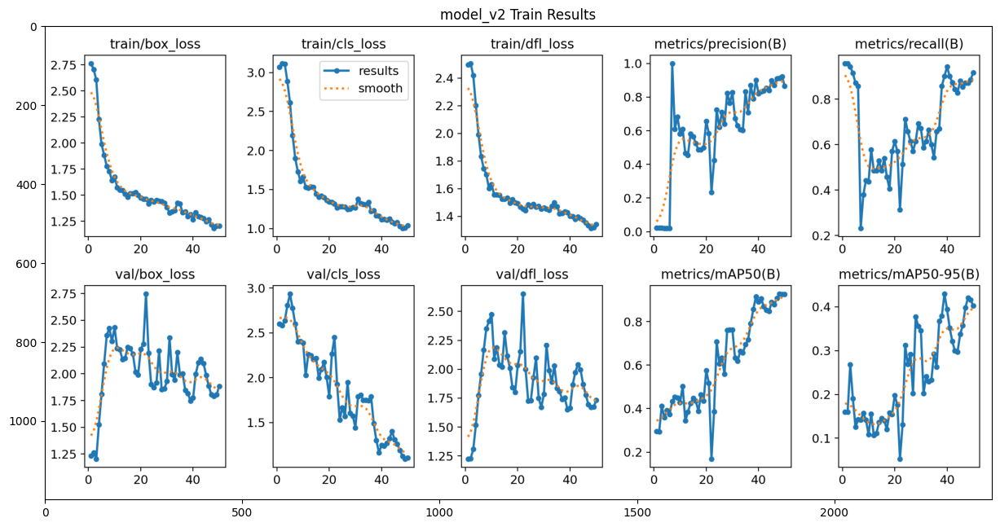

In [12]:
# 1st 50 ep
plt.figure(figsize=(15,8))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train/results.png"))
plt.title("model_v2 Train Results")

Text(0.5, 1.0, 'model_v2 Train Results')

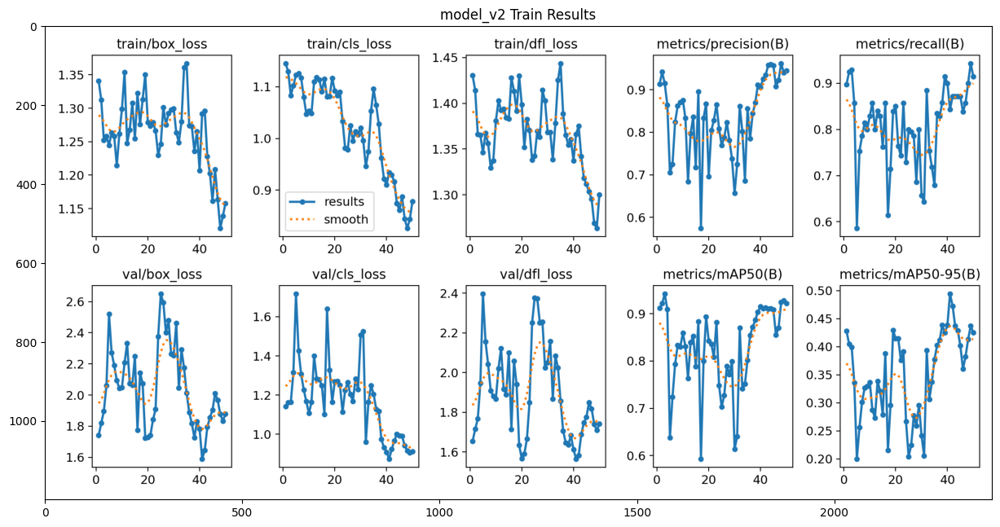

In [17]:
# 2nd 50 ep
plt.figure(figsize=(15,8))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/results.png"))
plt.title("model_v2 Train Results")

Text(0.5, 1.0, 'val_batch0_pred')

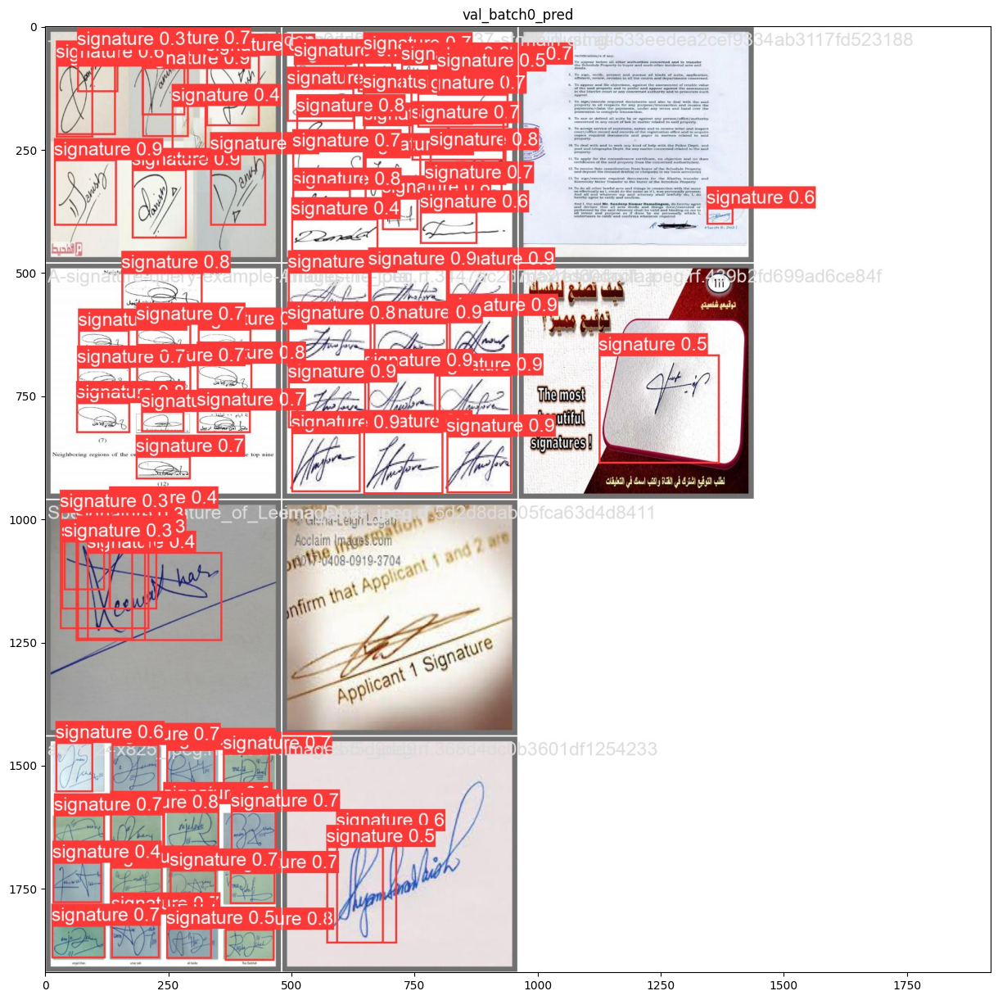

In [18]:
plt.figure(figsize=(15,15))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/val_batch0_pred.jpg"))
plt.title("val_batch0_pred")

Text(0.5, 1.0, 'confusion_matrix_normalized')

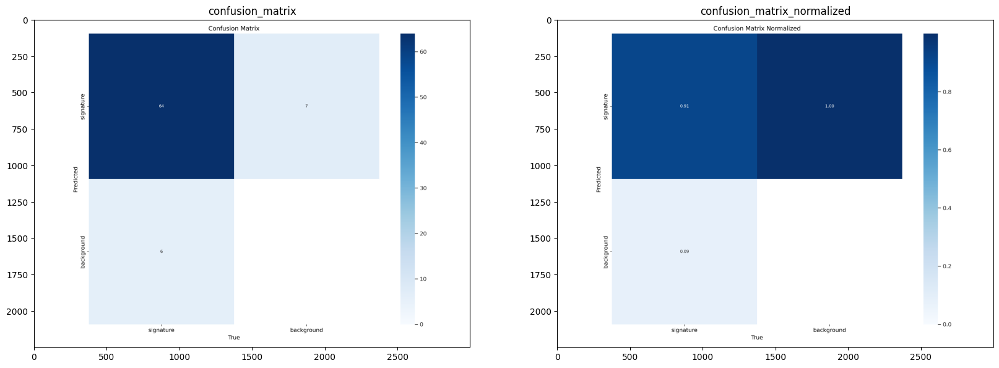

In [20]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/confusion_matrix.png"))
plt.title("confusion_matrix")
plt.subplot(1,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/confusion_matrix_normalized.png"))
plt.title("confusion_matrix_normalized")

Text(0.5, 1.0, 'PR_curve')

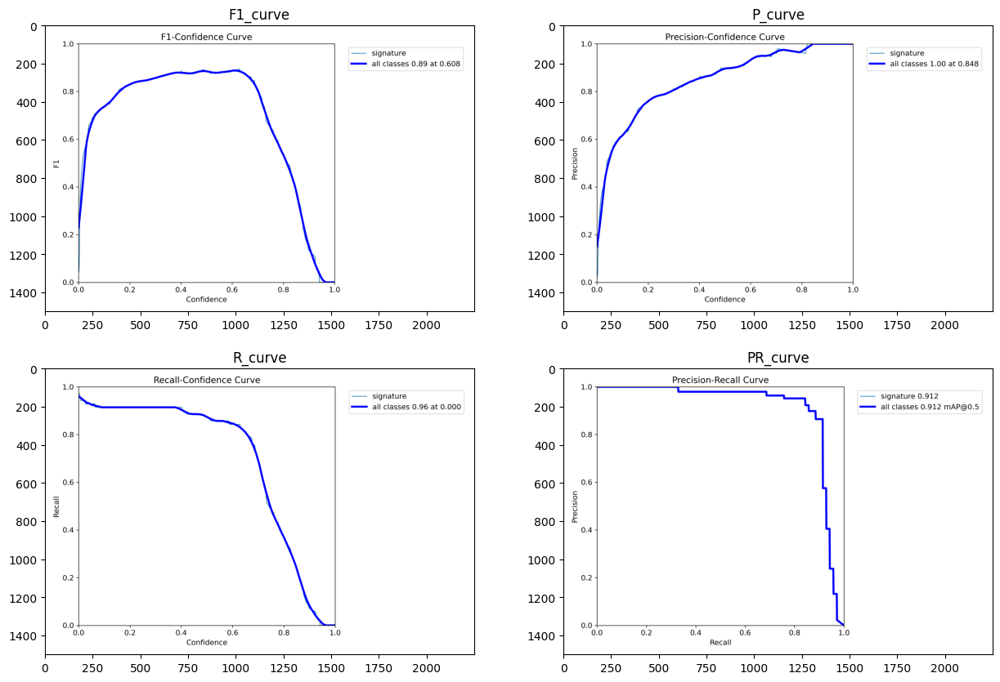

In [21]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/F1_curve.png"))
plt.title("F1_curve")
plt.subplot(2,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/P_curve.png"))
plt.title("P_curve")
plt.subplot(2,2,3)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/R_curve.png"))
plt.title("R_curve")
plt.subplot(2,2,4)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train2/PR_curve.png"))
plt.title("PR_curve")

In [22]:
# Train the model - Cheques Signatures Data

model_v3 = model.train(data="/kaggle/working/data_1.yaml", 
                       epochs=200, 
                       batch=64, # or -1 for AutoBatch
                       overlap_mask=False, # Determines whether segmentation masks should overlap during training 
                       save=True, # Enables saving of training checkpoints and final model weights
                       device=0, # "mps" for Appple silicon or [0, 1] for multi-GPU
                       optimizer='auto', # Auto selct the suitable optimizer
                       close_mosaic=20, # Disables mosaic data augmentation in the last N epochs to stabilize training
                       val=True, # Enables Validation
                       plots=True, # Generates and saves plots of training, validation metrics, and prediction examples
                       dropout=0.2, # Rate for regularization, preventing overfitting by randomly dropping units during training
                       translate=0.4, # Translates the image horizontally and vertically, aiding in learning to detect partially visible objects
                       scale=0.7, # Scales the image by a gain factor, simulating objects at different distances from the camera
                       degrees=30, # Random rotation within the specified degree range, improving the recognition ability at various orientations
                       hsv_v=0.7, # Alters the value (brightness), helping the model to perform well under various lighting conditions
                       hsv_s=0.9, # Alters the saturation, simulating different environmental conditions
                       hsv_h=0.3, # Alters the hue, introducing color variability
                       )

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/spark-it_model_v1_05-06.pt/pytorch/model_v1_05-06.pt/1/model_v1_05-06.pt, data=/kaggle/working/data_1.yaml, epochs=200, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=20, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=False, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_

Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/signature_verification-1/train/labels... 187 images, 0 backgrounds, 0 corrupt: 100%|██████████| 187/187 [00:00<00:00, 1284.28it/s]

train: New cache created: /kaggle/working/signature_verification-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/signature_verification-1/valid/labels... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 1027.46it/s]

val: New cache created: /kaggle/working/signature_verification-1/valid/labels.cache


Plotting labels to runs/detect/train22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train22
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      8.12G       2.04      6.404      1.917         41        640: 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         54         55      0.782      0.527      0.695        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      7.94G      2.215      6.785      2.114         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         54         55      0.783      0.509      0.685      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      7.93G       2.06      6.234      1.898         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         54         55      0.794      0.509      0.678      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      7.93G      1.942      4.975      1.837         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         54         55       0.72      0.636      0.733      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      7.93G      1.483       2.63      1.416         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         54         55      0.776      0.691      0.739      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      7.93G      1.409      2.093      1.352         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         54         55       0.89      0.873      0.906      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      7.93G      1.375      1.803      1.354         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         54         55      0.942      0.884      0.957      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      7.93G      1.286      1.788      1.314         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55      0.865      0.934      0.964      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      7.93G      1.299      1.633      1.327         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55      0.862      0.906      0.923      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      7.93G      1.289      1.547      1.315         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

                   all         54         55      0.902      0.873      0.931      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      7.93G      1.268      1.546      1.314         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         54         55      0.919      0.909      0.958      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      7.93G      1.266      1.593      1.288         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

                   all         54         55      0.974      0.927      0.966      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      7.93G      1.311      1.588       1.35         34        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         54         55      0.961      0.907      0.953        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      7.93G       1.34        1.5      1.318         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         54         55      0.979      0.927       0.97      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      7.93G      1.322      1.584      1.384         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         54         55      0.963      0.936       0.97      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      7.93G      1.253      1.455      1.314         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         54         55      0.938      0.945      0.984      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      7.93G      1.335      1.421      1.313         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         54         55      0.916      0.891       0.93      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      7.93G      1.366      1.385      1.295         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         54         55      0.923      0.876      0.942      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      7.93G      1.377      1.391      1.362         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         54         55      0.919      0.822      0.891       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      7.93G      1.548      1.393      1.388         38        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         54         55      0.956      0.798      0.866      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      7.93G      1.452      1.458      1.401         36        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55      0.851      0.873      0.891      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      7.93G      1.424      1.428      1.366         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         54         55      0.837      0.782       0.85      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      7.93G      1.394      1.372      1.435         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         54         55      0.864      0.764      0.814      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      7.93G      1.247       1.27      1.318         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         54         55      0.839      0.567      0.662       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      7.93G      1.322      1.347       1.35         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         54         55      0.865      0.232      0.363      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      7.93G      1.344      1.316      1.387         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         54         55          1     0.0335     0.0954     0.0505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      7.93G      1.423      1.232      1.413         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         54         55      0.913        0.8      0.845      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      7.93G      1.509      1.395      1.531         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         54         55      0.895      0.925      0.965      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      7.93G      1.448      1.252      1.447         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         54         55      0.977      0.891      0.975      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      7.93G      1.482      1.309       1.45         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         54         55      0.841      0.891      0.915      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      7.93G      1.297      1.245      1.368         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         54         55      0.751      0.745      0.809      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      7.93G       1.37      1.237      1.404         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         54         55       0.93      0.725      0.847      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      7.93G      1.499      1.242      1.481         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         54         55      0.866      0.764       0.76      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      7.93G      1.429      1.202      1.411         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         54         55      0.871      0.782      0.848      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      7.93G      1.461       1.28      1.455         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55      0.908      0.764      0.894      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      7.93G       1.47      1.324      1.494         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         54         55      0.799      0.673      0.736      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      7.93G      1.438      1.209      1.424         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

                   all         54         55      0.856      0.455      0.498      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      7.93G      1.358       1.12      1.372         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         54         55      0.796        0.4      0.393        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      7.93G      1.497      1.179      1.434         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         54         55      0.811      0.467      0.488      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      7.93G      1.395      1.179      1.431         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         54         55      0.651      0.436      0.481      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      7.93G      1.314      1.106      1.309         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55      0.479      0.127      0.115     0.0528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      7.93G      1.464      1.091      1.449         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         54         55      0.615      0.262      0.271      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      7.93G      1.459       1.11      1.431         50        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all         54         55      0.807      0.164      0.162      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      7.93G      1.466      1.158      1.445         35        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         54         55      0.841      0.193      0.181     0.0845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      7.93G      1.454      1.168      1.451         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         54         55      0.806      0.255       0.27      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      7.93G      1.488      1.196      1.498         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         54         55      0.848      0.818      0.876       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      7.93G      1.378      1.114      1.382         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         54         55      0.891      0.909       0.93      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      7.93G       1.32      1.071      1.361         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55      0.831      0.564      0.695      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      7.93G      1.485      1.092      1.462         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         54         55      0.821      0.667      0.752      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      7.93G      1.372     0.9739      1.417         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         54         55      0.601      0.713      0.664      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      7.93G      1.353      1.024      1.417         36        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         54         55      0.815      0.436      0.578      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      7.93G      1.372     0.9783      1.379         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         54         55       0.63      0.649      0.696      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      7.93G      1.481      1.073      1.485         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         54         55      0.798      0.764      0.829      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      7.93G      1.392      1.034      1.414         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         54         55      0.958      0.891      0.933        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      7.93G      1.343      0.938      1.374         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         54         55      0.946      0.873      0.925      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      7.93G      1.298     0.9292      1.394         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         54         55       0.91      0.727      0.868      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      7.93G      1.421      1.024      1.448         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         54         55      0.695      0.745      0.773       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      7.93G      1.317      1.011      1.372         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         54         55      0.832      0.873      0.898      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      7.93G      1.346     0.9173      1.351         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         54         55      0.888      0.945      0.967      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      7.93G      1.375      1.036      1.429         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         54         55      0.865      0.935       0.96      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      7.93G       1.26     0.9237      1.274         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         54         55      0.799      0.927      0.909      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      7.93G      1.291     0.9174      1.366         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         54         55      0.808      0.964      0.885      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      7.93G      1.318     0.9499      1.353         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         54         55      0.913      0.959      0.964      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      7.93G      1.265     0.8442      1.316         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         54         55      0.843      0.909      0.923      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      7.93G      1.446     0.9701      1.474         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

                   all         54         55      0.772      0.873      0.901      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      7.93G      1.268     0.9031      1.316         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         54         55      0.748      0.855      0.843      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      7.93G      1.332     0.9496      1.325         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         54         55      0.826      0.947      0.959      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      7.93G      1.422     0.9124      1.373         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         54         55      0.849      0.945      0.933      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      7.93G      1.315     0.8805      1.375         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         54         55      0.922      0.945      0.975      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      7.93G      1.343     0.9229      1.414         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         54         55      0.941      0.927       0.97       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      7.93G      1.248     0.9256      1.304         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         54         55      0.848      0.945      0.944      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      7.93G      1.216      0.879      1.313         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         54         55      0.865      0.945      0.932      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      7.93G      1.316     0.9394      1.392         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         54         55      0.902      0.982      0.977      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      7.93G      1.215     0.8785      1.302         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         54         55      0.982      0.971      0.984      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      7.93G      1.175     0.8367      1.258         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         54         55      0.952      0.945      0.973      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      7.93G      1.173     0.8309      1.298         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         54         55      0.953      0.964      0.974      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      7.93G      1.305     0.8222      1.414         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         54         55      0.946      0.957      0.969      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      7.93G      1.226     0.7932       1.33         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

                   all         54         55      0.896      0.964      0.974      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      7.93G      1.276     0.9047      1.347         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         54         55          1      0.937      0.981      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      7.93G      1.165     0.8172      1.321         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55      0.969      0.927      0.987      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      7.93G      1.185     0.8018       1.32         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         54         55       0.98      0.945      0.982      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      7.93G      1.305     0.8818      1.386         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         54         55      0.997      0.945      0.987      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      7.93G       1.27     0.8349      1.299         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         54         55          1       0.93      0.988      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      7.93G      1.188     0.7966      1.265         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         54         55      0.967      0.927      0.982      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      7.93G      1.139     0.7875      1.256         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         54         55      0.956      0.927      0.971      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      7.93G      1.174     0.8167      1.268         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         54         55      0.904      0.945      0.957      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      7.93G      1.133     0.6819      1.245         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         54         55        0.9      0.891      0.953      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      7.93G      1.109     0.7478      1.223         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         54         55      0.933      0.945      0.978      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      7.93G      1.152     0.8014      1.266         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         54         55      0.953      0.945      0.988      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      7.93G      1.184     0.6873      1.267         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         54         55      0.982      0.972      0.991      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      7.93G      1.209     0.8645      1.296         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all         54         55      0.963      0.945      0.988      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      7.93G      1.167     0.7245      1.254         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         54         55      0.964      0.966      0.982      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      7.93G       1.19     0.7256      1.252         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55      0.959      0.964      0.964      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      7.93G      1.214     0.7876      1.302         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55      0.941      0.909      0.969      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      7.93G      1.141     0.7489      1.237         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         54         55      0.909      0.945      0.983      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      7.93G      1.313     0.8627      1.384         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         54         55      0.979      0.964      0.992      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      7.93G      1.202      0.784      1.269         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         54         55      0.982      0.995      0.993      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      7.93G      1.101     0.7341       1.24         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         54         55      0.981      0.956      0.991      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      7.93G      1.087     0.6701      1.228         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         54         55      0.974      0.927      0.966      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      7.93G      1.174     0.6805      1.267         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         54         55      0.945      0.927      0.938      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      7.93G       1.21     0.7858      1.261         38        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55       0.94      0.909      0.963      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      7.93G      1.244     0.7975      1.296         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         54         55      0.995      0.964      0.973      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      7.93G      1.133     0.6882      1.251         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         54         55          1      0.905      0.967      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      7.93G      1.217     0.7288      1.289         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         54         55      0.961      0.964      0.987      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      7.93G      1.198      0.716      1.296         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.63it/s]

                   all         54         55      0.928      0.964      0.979       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      7.93G      1.173     0.7776      1.281         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all         54         55      0.895      0.935      0.963      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      7.93G      1.128     0.7352      1.255         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         54         55      0.877      0.927      0.949      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      7.93G      1.235     0.7792      1.299         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55      0.872      0.927      0.924      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      7.93G      1.108     0.6947      1.236         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         54         55      0.888      0.862      0.929      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      7.93G       1.12     0.7341      1.213         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55      0.957      0.813      0.906      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      7.93G       1.09     0.6676       1.24         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         54         55      0.978      0.798      0.883      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      7.93G      1.154     0.6664      1.262         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all         54         55      0.906      0.782      0.839      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      7.93G      1.089      0.683      1.214         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         54         55       0.92      0.764      0.888      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      7.93G      1.119     0.7071      1.221         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         54         55      0.892      0.903      0.967      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      7.93G      1.153     0.6784      1.252         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

                   all         54         55      0.956      0.964      0.988      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      7.93G      1.079     0.6561      1.167         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         54         55      0.896      0.938      0.979      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      7.93G      1.095     0.6779        1.2         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55      0.943       0.91      0.979      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      7.93G      1.107     0.7145      1.244         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         54         55          1      0.922      0.988      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      7.93G      1.087     0.7193      1.221         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55      0.986      0.964      0.994      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      7.93G      1.113     0.7117      1.243         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         54         55      0.997      0.982      0.994      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      7.93G      1.038     0.6467      1.175         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         54         55      0.982      0.976      0.993      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      7.93G       1.05     0.6794      1.215         50        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         54         55       0.99      0.945       0.99      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      7.93G      1.044     0.6445      1.164         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         54         55      0.964       0.97      0.991      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      7.93G      1.122     0.7173      1.221         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55      0.998      0.964      0.993      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      7.93G      1.088     0.6759      1.231         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55          1      0.961      0.993       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      7.93G      1.056     0.6941      1.218         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         54         55      0.973      0.945       0.99      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      7.93G      1.057     0.6779      1.182         48        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         54         55      0.979      0.964      0.991      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      7.93G     0.9118     0.5959      1.117         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55          1      0.943      0.992      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      7.93G      1.031      0.637      1.181         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         54         55      0.997      0.945      0.991      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      7.93G      1.035     0.6277      1.227         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         54         55      0.978      0.945      0.982      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      7.93G      1.036     0.7057      1.193         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         54         55      0.997      0.945      0.983       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      7.93G      1.136     0.6322      1.213         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         54         55          1       0.96      0.986      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      7.93G      1.131     0.6874      1.255         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         54         55      0.981      0.959      0.985       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      7.93G      1.046     0.6076      1.177         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

                   all         54         55      0.959      0.964      0.983      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      7.93G     0.9311     0.6317      1.139         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         54         55      0.956      0.964      0.982      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      7.93G     0.9776     0.6272      1.162         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55      0.962      0.945      0.982      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      7.93G      0.993     0.6112      1.173         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         54         55      0.981      0.938       0.98      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      7.93G       1.04     0.6159      1.197         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         54         55      0.991      0.927       0.98      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      7.93G      1.024     0.6672      1.188         50        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         54         55          1      0.938      0.982      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      7.93G     0.9856     0.5872      1.112         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         54         55      0.979      0.982      0.987      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      7.93G      0.943     0.5365      1.141         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         54         55      0.982      0.976      0.987      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      7.93G     0.9608      0.593      1.148         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         54         55      0.978      0.945      0.985      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      7.93G     0.9798     0.6172      1.128         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         54         55      0.995      0.945      0.986       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      7.93G      1.032     0.6235      1.198         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         54         55      0.981      0.957      0.988       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      7.93G      0.993      0.602      1.186         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         54         55      0.967      0.945      0.991      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      7.93G      1.042     0.6604      1.214         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         54         55      0.971      0.964      0.993      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      7.93G     0.9358     0.5437       1.11         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         54         55      0.946          1      0.992      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      7.93G     0.9899     0.5897      1.181         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         54         55      0.945          1      0.992      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      7.93G      1.034     0.6476      1.218         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         54         55       0.96      0.964      0.992      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      7.93G     0.9544     0.6027      1.174         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         54         55      0.946      0.962       0.99      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      7.93G       1.03     0.6101      1.184         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         54         55          1       0.92      0.986      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      7.93G      1.039     0.6493      1.145         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         54         55          1      0.925      0.983       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      7.93G     0.9763     0.5611      1.158         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         54         55          1      0.926      0.987      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      7.93G     0.9408     0.5697      1.105         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         54         55          1       0.96      0.993      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      7.93G     0.9252     0.5528       1.11         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55      0.963      0.982      0.993      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      7.93G     0.9897     0.5863      1.147         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

                   all         54         55      0.957      0.982      0.991      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      7.93G     0.9835      0.597      1.168         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         54         55      0.961      0.982      0.992      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      7.93G     0.9103     0.5425      1.093         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         54         55      0.964      0.964      0.992      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      7.93G     0.9941     0.5882      1.148         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         54         55      0.968      0.982      0.992      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      7.93G     0.9962     0.6056      1.152         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         54         55       0.97      0.982      0.991      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      7.93G      1.012     0.6165      1.193         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         54         55      0.961      0.982      0.985      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      7.93G      1.008      0.632      1.166         37        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55      0.964      0.982      0.988      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      7.93G     0.9629     0.5461      1.139         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         54         55       0.96      0.982      0.988      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      7.93G     0.9316     0.5779      1.101         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         54         55      0.962      0.982      0.984      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      7.93G      1.106     0.6391       1.23         38        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         54         55      0.964      0.982      0.984      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      7.93G     0.9774     0.6219       1.14         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         54         55      0.982      0.979      0.993      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      7.93G      1.049     0.5808       1.16         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         54         55      0.982      0.979      0.993      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      7.93G     0.9282     0.5485      1.077         50        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         54         55      0.981      0.961      0.992      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      7.93G     0.9326       0.57      1.143         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         54         55      0.947      0.981       0.99      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      7.93G     0.9385      0.572      1.112         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         54         55      0.962      0.964      0.989      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      7.93G     0.9116     0.5437      1.104         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55      0.964      0.963      0.988      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      7.93G     0.8973     0.5304      1.129         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         54         55      0.962      0.964      0.989        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      7.93G      0.985     0.6276      1.177         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         54         55      0.961      0.964       0.99      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      7.93G     0.8386     0.4772      1.016         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         54         55      0.981       0.96      0.991      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      7.93G     0.9604     0.5128      1.151         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         54         55      0.981      0.962      0.992      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      7.93G     0.8437     0.5014      1.052         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all         54         55      0.981      0.964      0.992      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      7.93G     0.8211     0.5212      1.059         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         54         55          1      0.962      0.987      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      7.93G     0.9027     0.5841      1.075         39        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         54         55          1      0.956      0.988       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      7.93G     0.8772     0.5606      1.073         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         54         55          1      0.957      0.988      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      7.93G     0.8724      0.551      1.103         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         54         55          1      0.958      0.993      0.803


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      7.93G     0.9049     0.5242      1.095         40        640: 100%|██████████| 3/3 [00:04<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

                   all         54         55      0.977      0.964      0.991      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      7.93G     0.8983     0.5246      1.085         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         54         55      0.964      0.982      0.987      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      7.93G     0.8484     0.5131      1.094         44        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         54         55      0.964      0.982      0.987      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      7.93G     0.8793     0.5181      1.093         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         54         55          1      0.955      0.988      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      7.93G     0.8567     0.5213      1.082         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         54         55          1      0.959      0.988      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      7.93G     0.9002     0.5341      1.116         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         54         55      0.962      0.982      0.988      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      7.93G     0.8436     0.4824      1.074         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         54         55      0.982      0.978      0.988      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      7.93G     0.8669     0.5673      1.095         45        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         54         55      0.982      0.979      0.988      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      7.93G     0.8992     0.5219      1.072         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         54         55      0.982      0.979      0.988      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      7.93G     0.8383     0.4714      1.063         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         54         55      0.982      0.978      0.988      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      7.93G     0.8285     0.4919      1.061         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         54         55      0.962      0.982      0.991      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      7.93G     0.8091      0.502      1.076         43        640: 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         54         55      0.964      0.982      0.987      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      7.93G     0.8348     0.4932      1.053         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         54         55      0.964      0.981      0.987      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      7.93G     0.8318     0.4745      1.074         47        640: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         54         55      0.964      0.982      0.987      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      7.93G     0.7895     0.5063      1.051         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         54         55      0.963      0.982      0.991      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      7.93G     0.9044     0.5068      1.123         40        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         54         55      0.978      0.964       0.99      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      7.93G      0.804     0.4809      1.031         49        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

                   all         54         55      0.961      0.964      0.989       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      7.93G     0.8662     0.4768      1.055         41        640: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         54         55      0.961      0.964      0.989      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      7.93G     0.7763     0.4399      1.014         46        640: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         54         55      0.961      0.964       0.99      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      7.93G     0.8215     0.4922      1.058         42        640: 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         54         55      0.943      0.982      0.991      0.821



200 epochs completed in 0.188 hours.
Optimizer stripped from runs/detect/train22/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train22/weights/best.pt, 6.3MB

Validating runs/detect/train22/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


                   all         54         55      0.964      0.981      0.987      0.833
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train22


lr/pg0,▁▂▄▅▆▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁
lr/pg1,▁▂▄▅▆▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁
lr/pg2,▁▂▄▅▆▇████▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁
metrics/mAP50(B),▆▇██▇▁▇▆▂▇▆▇▇████████▇▇█████████████████
metrics/mAP50-95(B),▄▆▇▆▅▁▅▄▂▅▄▅▆▅▆▅▇▇▆▇▇▆▆▇▇▇▇▇▇█▇▇▇███████
metrics/precision(B),▄▆█▇▅█▇▄▁▅▁▆▅▅▆▆█▇▇██▆▆███▇██▇█▇▇█████▇▇
metrics/recall(B),▄▇▇█▆▁▆▆▃▇▅▆█████████▇▆▇███▇████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▄▃▃▄▄▄▄▄▄▄▃▃▄▃▃▃▂▃▂▃▃▃▂▂▁▂▂▂▂▂▁▂▂▁▁▁▁▁▁


Text(0.5, 1.0, 'model_v2 Train Results')

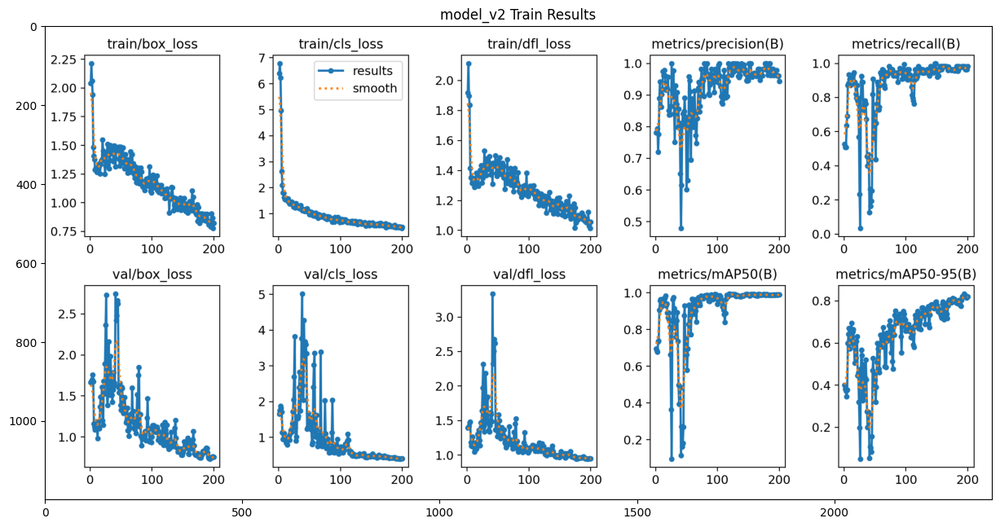

In [30]:
plt.figure(figsize=(15,8))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/results.png"))
plt.title("model_v2 Train Results")

Text(0.5, 1.0, 'val_batch0_pred')

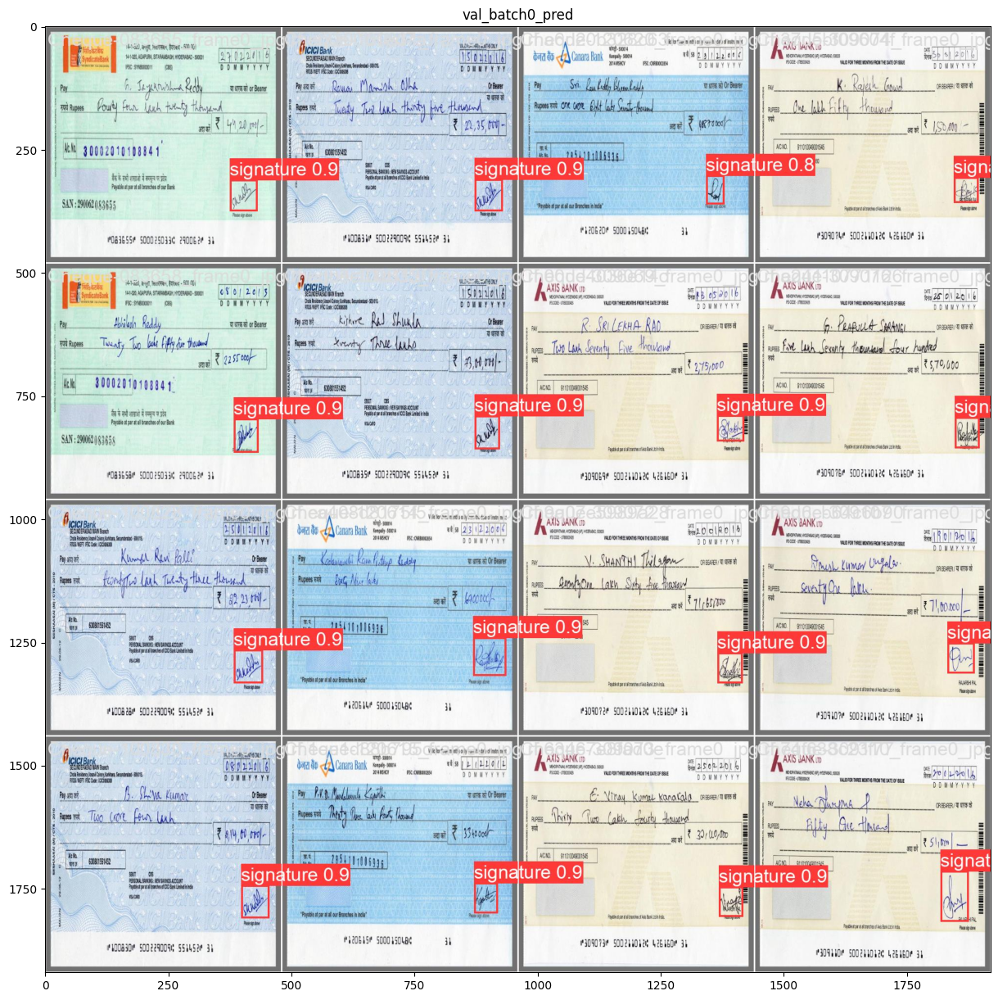

In [31]:
plt.figure(figsize=(15,15))
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/val_batch0_pred.jpg"))
plt.title("val_batch0_pred")

Text(0.5, 1.0, 'confusion_matrix_normalized')

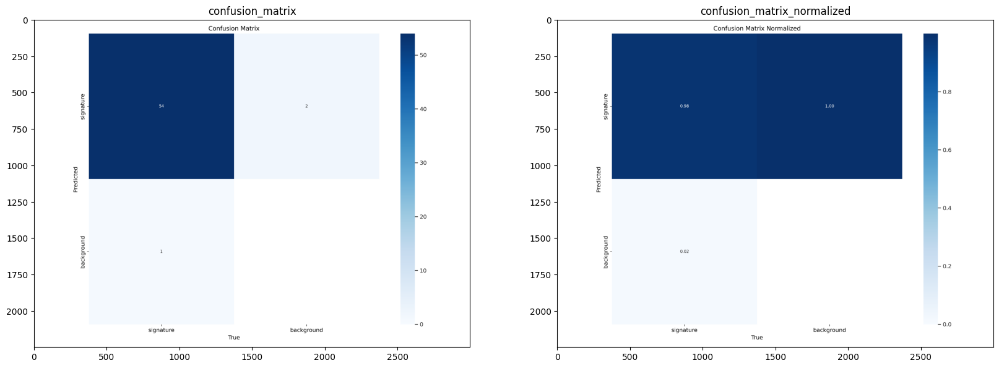

In [32]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/confusion_matrix.png"))
plt.title("confusion_matrix")
plt.subplot(1,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/confusion_matrix_normalized.png"))
plt.title("confusion_matrix_normalized")

Text(0.5, 1.0, 'PR_curve')

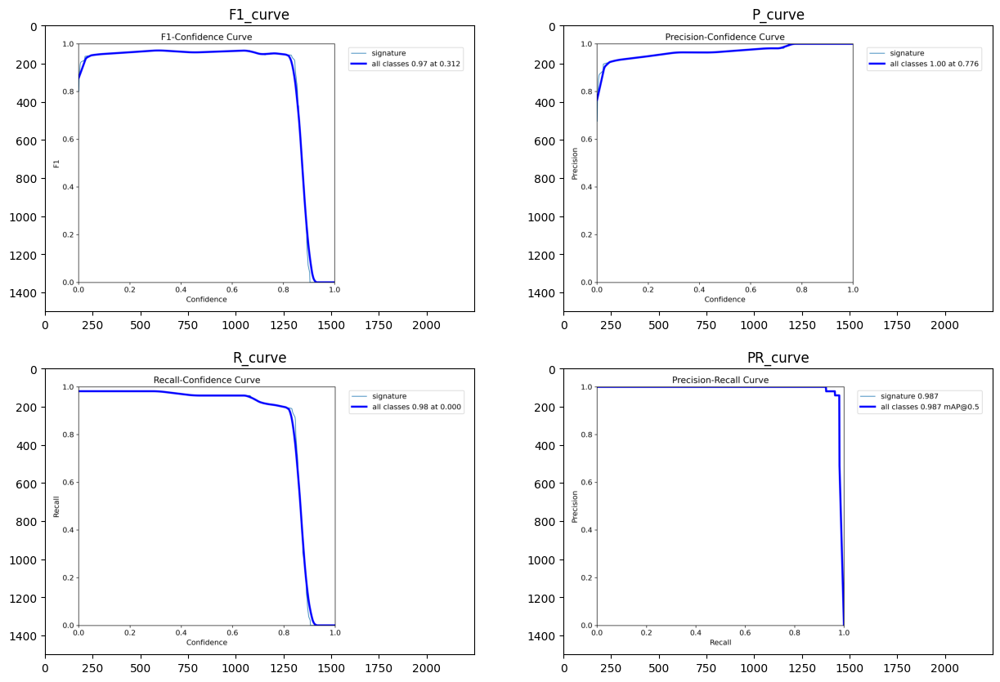

In [33]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/F1_curve.png"))
plt.title("F1_curve")
plt.subplot(2,2,2)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/P_curve.png"))
plt.title("P_curve")
plt.subplot(2,2,3)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/R_curve.png"))
plt.title("R_curve")
plt.subplot(2,2,4)
plt.imshow(plt.imread("/kaggle/working/runs/detect/train22/PR_curve.png"))
plt.title("PR_curve")

In [44]:
# A function for inferance

def testExamples(imgs_src, selected_model, confidence, figsize=(20,20), columns=2):
    tests = []
    for img_src in imgs_src:
        tests.append(selected_model.predict(img_src, conf=confidence)[0].plot())
    plt.figure(figsize=figsize)
    for i, img in enumerate(tests):
        plt.subplot(len(tests)//columns+1, columns, i+1)
        plt.imshow(img)


Found https://i.sstatic.net/vxukS.jpg locally at vxukS.jpg
image 1/1 /kaggle/working/vxukS.jpg: 320x640 1 signature, 8.9ms
Speed: 1.9ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)

Found https://dygtyjqp7pi0m.cloudfront.net/i/38609/33122531_1.jpg locally at 33122531_1.jpg
image 1/1 /kaggle/working/33122531_1.jpg: 640x512 1 signature, 7.6ms
Speed: 2.7ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)

Found https://www.historyforsale.com/productimages/large/276772.jpg locally at 276772.jpg
image 1/1 /kaggle/working/276772.jpg: 640x512 1 signature, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)


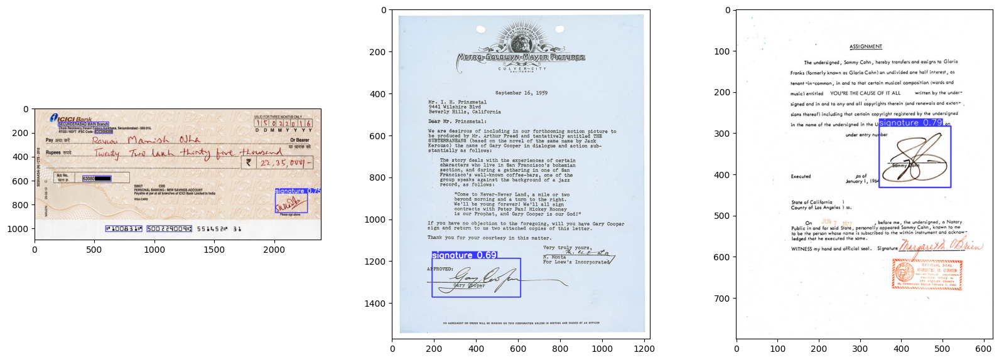

In [50]:
# Test the model

imgs_src_list = ["https://i.sstatic.net/vxukS.jpg",
                 "https://dygtyjqp7pi0m.cloudfront.net/i/38609/33122531_1.jpg",
                 "https://www.historyforsale.com/productimages/large/276772.jpg",
                ]

testExamples(imgs_src=imgs_src_list, selected_model=model, confidence=0.2, figsize=(20,15), columns=3)


In [59]:
# Save the model in .pt format
final_model=YOLO("/kaggle/working/runs/detect/train22/weights/best.pt")
final_model.save("final_model_06-06_1.pt")


Found https://i.sstatic.net/vxukS.jpg locally at vxukS.jpg
image 1/1 /kaggle/working/vxukS.jpg: 320x640 1 signature, 8.6ms
Speed: 1.9ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)

Found https://dygtyjqp7pi0m.cloudfront.net/i/38609/33122531_1.jpg locally at 33122531_1.jpg
image 1/1 /kaggle/working/33122531_1.jpg: 640x512 1 signature, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)

Found https://www.historyforsale.com/productimages/large/276772.jpg locally at 276772.jpg
image 1/1 /kaggle/working/276772.jpg: 640x512 1 signature, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)


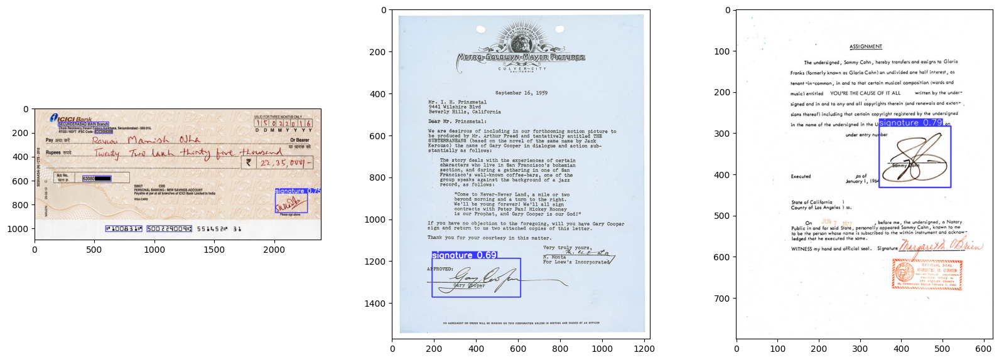

In [60]:
# Test the saved model just to be sure

test_model=YOLO("final_model_06-06_1.pt")
testExamples(imgs_src=imgs_src_list, selected_model=test_model, confidence=0.2, figsize=(20,15), columns=3)

In [68]:
# Exporting an onnx format model

final_model.export(format="onnx")
!cd /kaggle/working
from IPython.display import FileLink
FileLink(r'./runs/detect/train22/weights/best.onnx')

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train22/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)

ONNX: starting export with onnx 1.16.1 opset 17...
ONNX: export success ✅ 0.8s, saved as '/kaggle/working/runs/detect/train22/weights/best.onnx' (11.7 MB)

Export complete (2.4s)
Results saved to /kaggle/working/runs/detect/train22/weights
Predict:         yolo predict task=detect model=/kaggle/working/runs/detect/train22/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/kaggle/working/runs/detect/train22/weights/best.onnx imgsz=640 data=/kaggle/working/data_1.yaml  
Visualize:       https://netron.app


'/kaggle/working/runs/detect/train22/weights/best.onnx'

In [159]:
# Cropping and Saving the signature

def cropSignature(image_path, save_dir, model):  
    prediction = model.predict(image_path, conf=0.2)
    prediction[0].save_crop(save_dir=save_dir, file_name=save_dir+"croppedSignature")
    print("\n-- Cropped Signature Path:")
    return save_dir+"croppedSignature"

In [160]:
cropSignature(image_path="/kaggle/working/vxukS.jpg", save_dir="/kaggle/working/", model=final_model)


image 1/1 /kaggle/working/vxukS.jpg: 320x640 1 signature, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)

-- Cropped Signature Path:


'/kaggle/working/croppedSignature'

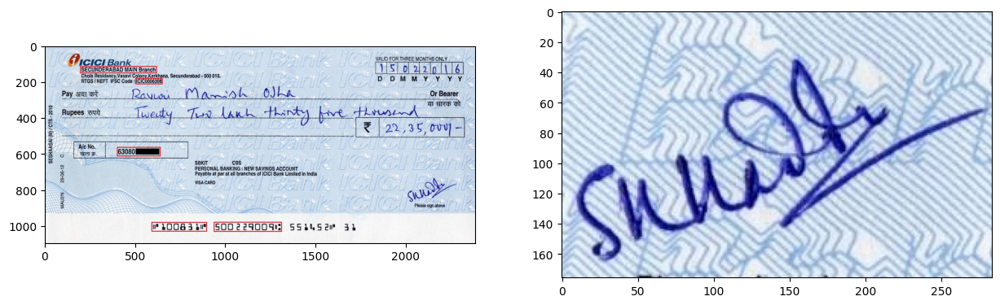

In [136]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
plt.imshow(plt.imread("/kaggle/working/vxukS.jpg"))
plt.subplot(1,2,2)
plt.imshow(plt.imread("/kaggle/working/croppedSignature.jpg"))